In [1]:
from datetime import date, datetime, timedelta
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.graph_objects as go 
import plotly.express as px 
import seaborn as sns
from plotly.subplots import make_subplots

from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans 
from sklearn.metrics import silhouette_score,silhouette_samples
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.preprocessing import StandardScaler


from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

In [2]:
orders_data = pd.read_csv("olist_orders_dataset.csv") 
customers_data = pd.read_csv("olist_customers_dataset.csv") 
items_data = pd.read_csv("olist_order_items_dataset.csv") 

In [3]:
orders_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [4]:
customers_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [5]:
items_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [6]:
orders_data.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [7]:
customers_data.isnull().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [8]:
items_data.isnull().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [9]:
df= orders_data.merge(customers_data,on="customer_id") 
df= df.merge(items_data ,on="order_id") 
print(df.info())
print(df.nunique(axis=0))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112650 entries, 0 to 112649
Data columns (total 18 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       112650 non-null  object 
 1   customer_id                    112650 non-null  object 
 2   order_status                   112650 non-null  object 
 3   order_purchase_timestamp       112650 non-null  object 
 4   order_approved_at              112635 non-null  object 
 5   order_delivered_carrier_date   111456 non-null  object 
 6   order_delivered_customer_date  110196 non-null  object 
 7   order_estimated_delivery_date  112650 non-null  object 
 8   customer_unique_id             112650 non-null  object 
 9   customer_zip_code_prefix       112650 non-null  int64  
 10  customer_city                  112650 non-null  object 
 11  customer_state                 112650 non-null  object 
 12  order_item_id                 

In [10]:
print(df['order_id'].apply(type).value_counts())
print(df['order_purchase_timestamp'].apply(type).value_counts())
print(df['customer_unique_id'].apply(type).value_counts())

<class 'str'>    112650
Name: order_id, dtype: int64
<class 'str'>    112650
Name: order_purchase_timestamp, dtype: int64
<class 'str'>    112650
Name: customer_unique_id, dtype: int64


In [11]:
df['order_purchase_timestamp'] = df['order_purchase_timestamp'].apply(lambda x:datetime.strptime(x,'%Y-%m-%d %H:%M:%S').date())

In [12]:
y = df['order_purchase_timestamp'].max()

In [13]:
dfc=df.groupby('customer_unique_id').agg({'order_id':'nunique', 'price':'sum', 'order_purchase_timestamp':lambda x: (y - x.max()).days}).reset_index() 
dfc=dfc.rename(columns={'order_id':'frequency', 'price':'monetary', 'order_purchase_timestamp':'recency'})
dfc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95420 entries, 0 to 95419
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  95420 non-null  object 
 1   frequency           95420 non-null  int64  
 2   monetary            95420 non-null  float64
 3   recency             95420 non-null  int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 2.9+ MB


In [14]:
def format_title(title, subtitle=None):
    if not subtitle:
        return title
    subtitle = f'<span style="font-size: 10px;">{subtitle}</span>'
    return f'{title}<br>{subtitle}'


fig = make_subplots(rows=1  , cols=3)

fig.add_trace(go.Histogram(x=dfc['recency'], opacity=0.7, name="recency"), row=1, col=1)
fig.add_trace(go.Histogram(x=dfc['frequency'], opacity=0.9, name= 'frequency'), row=1, col=2)
fig.add_trace(go.Histogram(x=dfc['monetary'], opacity=0.9, name='monetary'), row=1, col=3)

fig.update_xaxes(title_text="recency", row=1, col=1)
fig.update_xaxes(title_text="frequency", row=1, col=2)
fig.update_xaxes(title_text="monetary", row=1, col=3)


fig.update_layout(plot_bgcolor="white", title_text= format_title("RFM Histograms - Knowing the distributions", "Histogram shows how many observations fall into an interval"),title_x=0.5, showlegend=False)
fig.show()

In [15]:
dfcs=StandardScaler().fit_transform(dfc.drop(["customer_unique_id"], axis=1))
dfcs

array([[-0.16104511, -0.05761497, -0.83247204],
       [-0.16104511, -0.56759586, -0.81288468],
       [-0.16104511, -0.33741529,  1.94893216],
       ...,
       [-0.16104511, -0.24139187,  2.15133482],
       [-0.16104511, -0.12607186, -0.78023909],
       [-0.16104511, -0.39259431,  1.60288892]])

In [16]:
range_n_clusters = [2, 3, 4, 5, 6,7,8]
silscore = []
distortions=[]
X = dfcs.copy()

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=101)
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silscore.append(silhouette_avg)
    distortions.append(clusterer.inertia_)
    print("For n_clusters =", n_clusters," | ", "The average silhouette_score is :", silhouette_avg," | ", "The distortion is :", clusterer.inertia_)
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

For n_clusters = 2  |  The average silhouette_score is : 0.7371027839734499  |  The distortion is : 206639.98907713103
For n_clusters = 3  |  The average silhouette_score is : 0.45918547857633396  |  The distortion is : 141379.29602507228
For n_clusters = 4  |  The average silhouette_score is : 0.49076678854163364  |  The distortion is : 94311.4709672473
For n_clusters = 5  |  The average silhouette_score is : 0.4215496465963634  |  The distortion is : 79306.01832862476
For n_clusters = 6  |  The average silhouette_score is : 0.43951267058692145  |  The distortion is : 64782.26478527042
For n_clusters = 7  |  The average silhouette_score is : 0.4441626550071532  |  The distortion is : 55275.172665782586
For n_clusters = 8  |  The average silhouette_score is : 0.448800246536078  |  The distortion is : 49205.274456915606


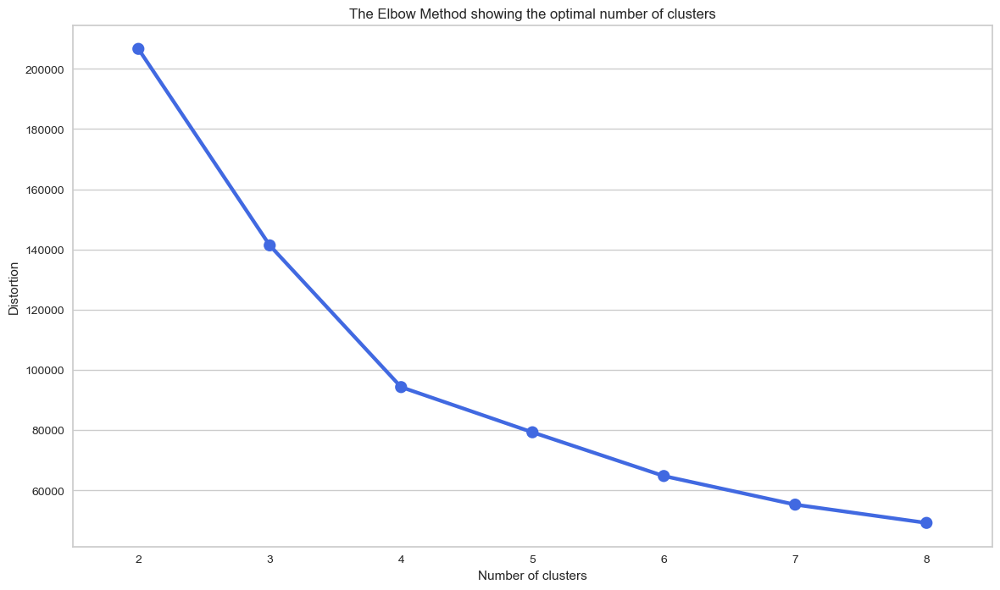

In [17]:
plt.figure(figsize=(14,8))
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal number of clusters')
sns.pointplot(x=range_n_clusters,y=distortions,color='royalblue')
plt.show()

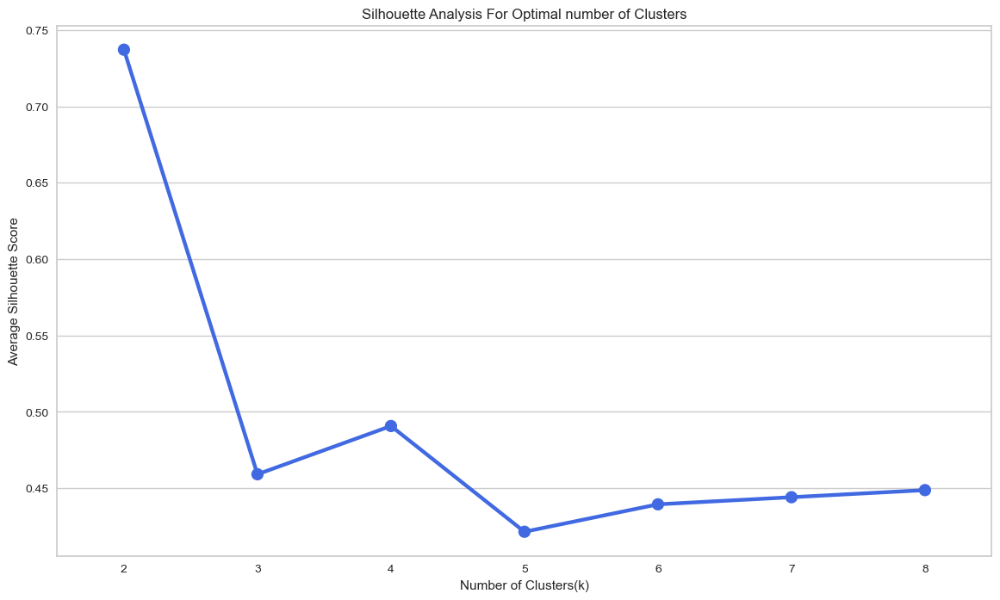

In [18]:
plt.figure(figsize=(14,8))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Average Silhouette Score')
plt.title('Silhouette Analysis For Optimal number of Clusters')
sns.pointplot(x=range_n_clusters,y=silscore,color='royalblue')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.7371027839734499
For n_clusters = 3 The average silhouette_score is : 0.45918547857633396
For n_clusters = 4 The average silhouette_score is : 0.49076678854163364
For n_clusters = 5 The average silhouette_score is : 0.4215496465963634
For n_clusters = 6 The average silhouette_score is : 0.43951267058692145
For n_clusters = 7 The average silhouette_score is : 0.4441626550071532
For n_clusters = 8 The average silhouette_score is : 0.448800246536078


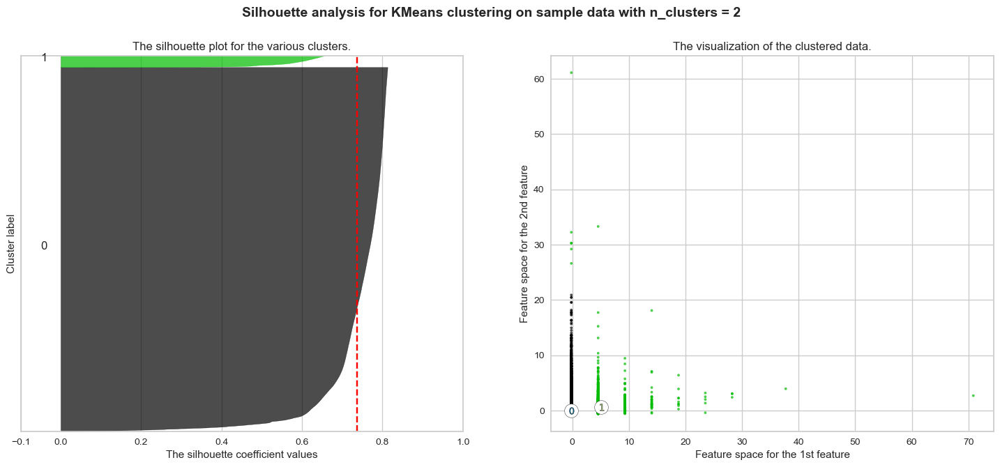

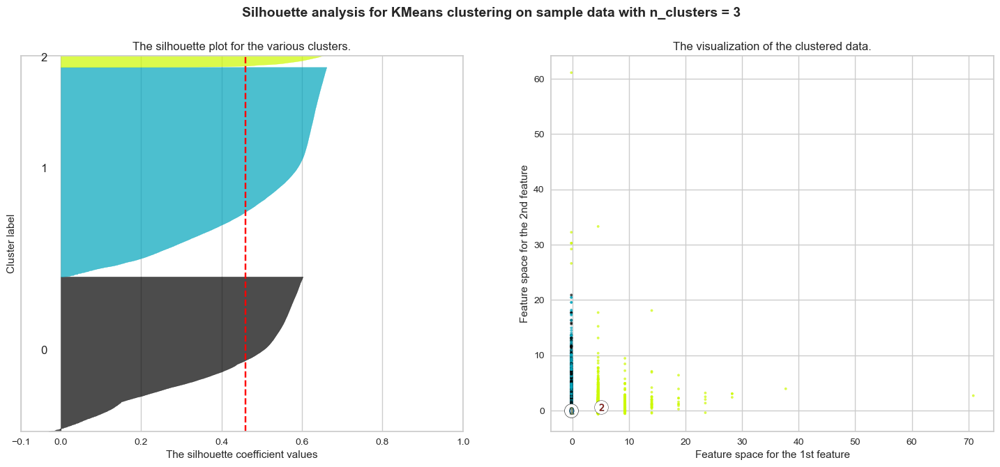

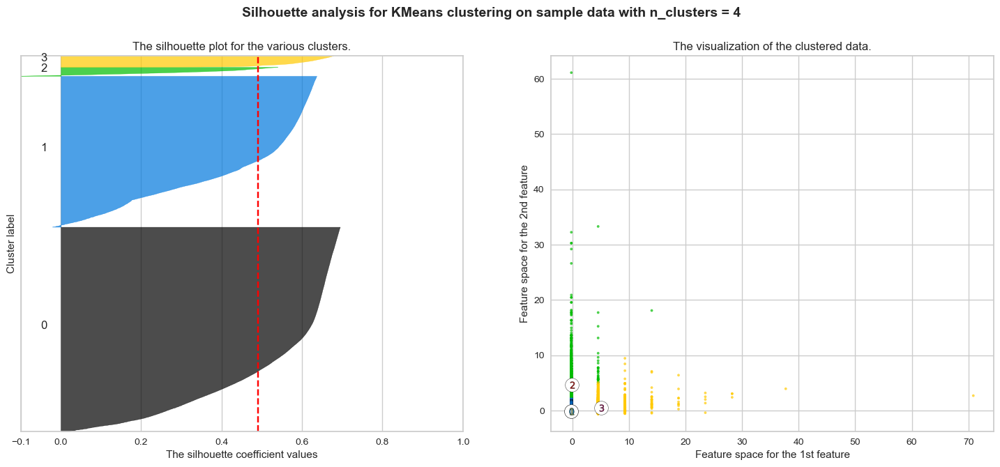

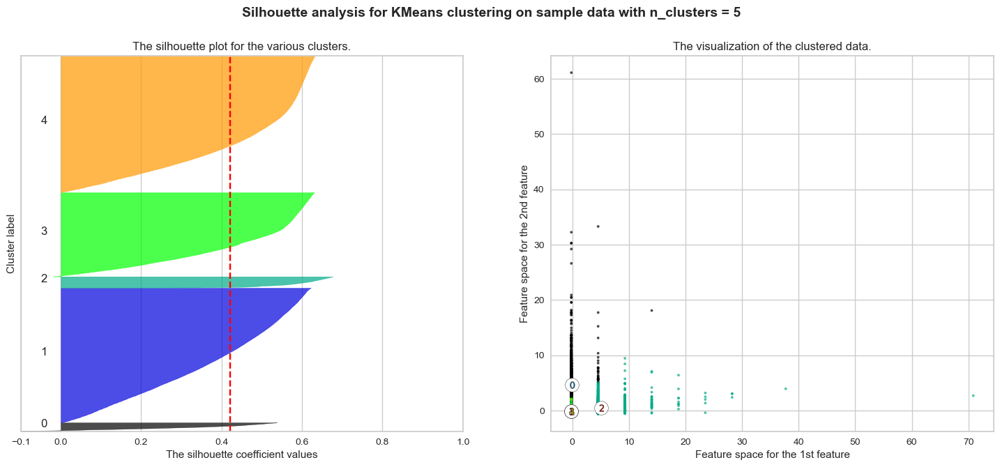

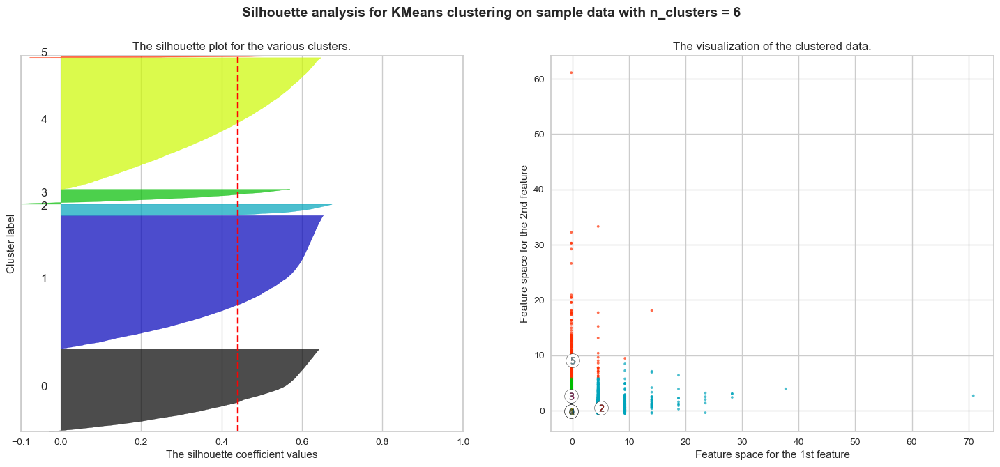

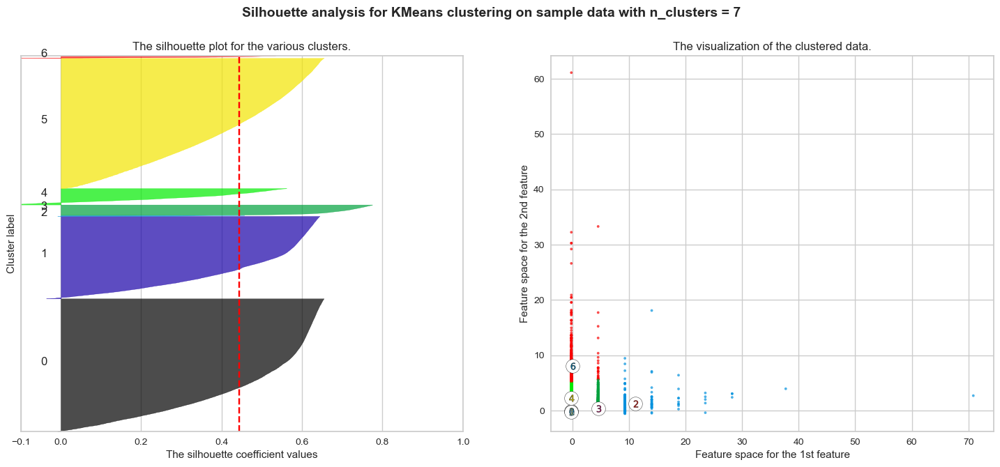

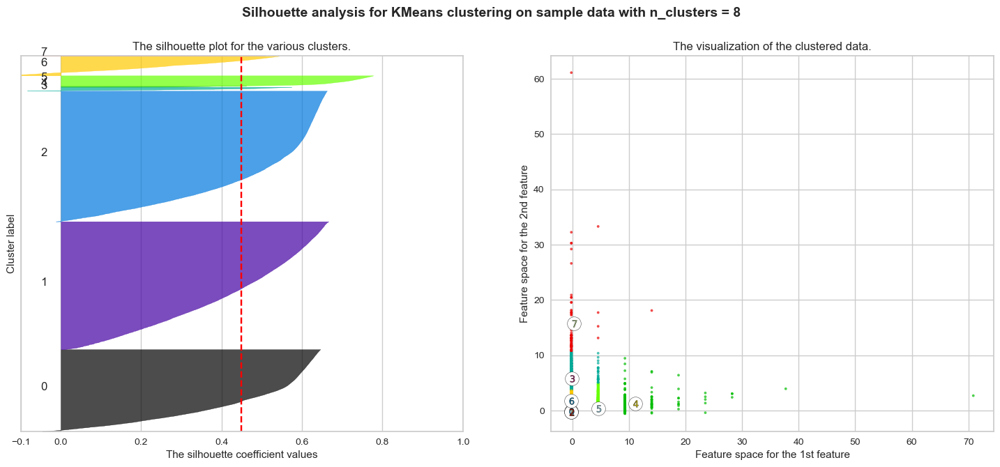

In [19]:
for n_clusters in range_n_clusters:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 8])
    clusterer = KMeans(n_clusters=n_clusters, random_state=101)
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,"The average silhouette_score is :", silhouette_avg)
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 8
    for i in range(n_clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 8  

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [20]:
kmodel=KMeans(n_clusters=4,random_state=101)
dfc["cluster_kmeans"] = kmodel.fit_predict(dfcs)

fig= px.scatter_3d(dfc, x='frequency', y='monetary', z='recency', color='cluster_kmeans',opacity=0.5)
fig.update_traces(marker_size = 3)
fig.show()

In [21]:
dfc_table=dfc.groupby('cluster_kmeans').agg(mean_frequency=pd.NamedAgg('frequency', 'mean'),
                                           mean_recency=pd.NamedAgg('recency', 'mean'),
                                           mean_monetary=pd.NamedAgg('monetary', 'mean'),
                                           cluster_size=pd.NamedAgg('cluster_kmeans','count')).reset_index()
dfc_table=dfc_table.round({"mean_frequency":1, "mean_recency":0, "mean_monetary":0})
dfc_table=dfc_table.astype({'mean_recency':'int', 'mean_monetary':'int'})
dfc_table

,cluster_kmeans,mean_frequency,mean_recency,mean_monetary,cluster_size
0,0,1.0,133,114,51917
1,1,1.0,394,115,38352
2,2,1.0,244,1146,2268
3,3,2.1,226,243,2883


In [22]:
Kmeansdf = dfc.copy()
Kmeansdf['Cluster_by_KMeans'] = kmodel.labels_
Kmeansdf["Cluster_by_KMeans"] = Kmeansdf["Cluster_by_KMeans"].astype(str)

In [23]:
clustercount = Kmeansdf['Cluster_by_KMeans'].value_counts().to_frame().reset_index().rename(columns={"index":"Cluster","Cluster_by_KMeans":"Count"}).sort_values(by='Cluster',
ascending=True)
clustercount

,Cluster,Count
0,0,51917
1,1,38352
3,2,2268
2,3,2883


In [24]:
range_eps = [0.2, 0.3, 0.4, 0.5, 0.6,0.7,0.8]
silscore_db = []
clusters_range = []
for eps in range_eps:
    clusterer = DBSCAN(eps=eps, min_samples = 6, metric='euclidean') 
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silscore_db.append(silhouette_avg)
    n_clusters = len(set(clusterer.labels_))
    clusters_range.append(n_clusters)
    n_outliers = (clusterer.labels_ == -1).sum()
    percentage_of_outliers = (n_outliers/X.shape[0])*100
    print("Percentage of outliers:", percentage_of_outliers)
    print("Number of outliers:", n_outliers)
    print("Number of clusters:", n_clusters)
    print("For eps =", eps," | ", "The average silhouette_score is :", silhouette_avg)
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

Percentage of outliers: 0.6319429888912178
Number of outliers: 603
Number of clusters: 33
For eps = 0.2  |  The average silhouette_score is : 0.44070138529148556
Percentage of outliers: 0.32802347516243974
Number of outliers: 313
Number of clusters: 14
For eps = 0.3  |  The average silhouette_score is : 0.45035841183319875
Percentage of outliers: 0.22951163278138756
Number of outliers: 219
Number of clusters: 11
For eps = 0.4  |  The average silhouette_score is : 0.46704544383677427
Percentage of outliers: 0.16243974009641585
Number of outliers: 155
Number of clusters: 10
For eps = 0.5  |  The average silhouette_score is : 0.473332137099236
Percentage of outliers: 0.12471180046111927
Number of outliers: 119
Number of clusters: 10
For eps = 0.6  |  The average silhouette_score is : 0.7083837814889586
Percentage of outliers: 0.10584783064347097
Number of outliers: 101
Number of clusters: 7
For eps = 0.7  |  The average silhouette_score is : 0.7080204883558117
Percentage of outliers: 0.08

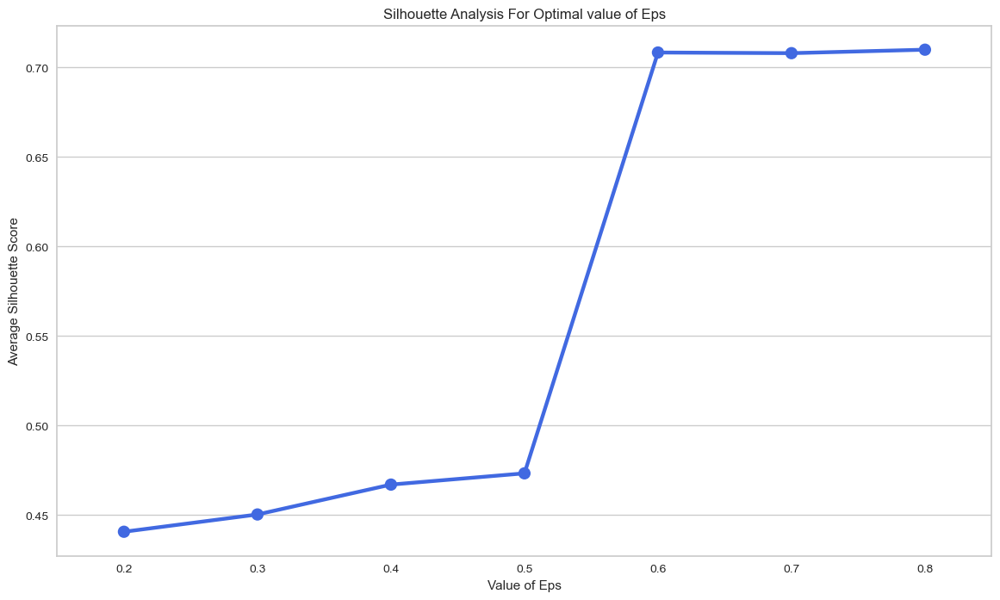

In [25]:
plt.figure(figsize=(14,8))
plt.xlabel('Value of Eps')
plt.ylabel('Average Silhouette Score')
plt.title('Silhouette Analysis For Optimal value of Eps')
sns.pointplot(x=range_eps,y=silscore_db,color='royalblue')
plt.show()

In [26]:
dmodel=DBSCAN(eps=0.8, min_samples = 6, metric='euclidean')  
dfc["cluster_dbscan"] = dmodel.fit_predict(dfcs)

fig= px.scatter_3d(dfc, x='frequency', y='monetary', z='recency', color='cluster_dbscan',opacity=0.5)
fig.update_traces(marker_size = 3)
fig.show()

In [27]:
Kmeansdf["DBSCAN_clusters"] = dmodel.labels_
Kmeansdf.tail(15)

,customer_unique_id,frequency,monetary,recency,cluster_kmeans,Cluster_by_KMeans,DBSCAN_clusters
95405,fff3a9369e4b7102fab406a334a678c3,1,84.90,388,1,1,0
95406,fff3e1d7bc75f11dc7670619b2e61840,1,54.85,45,0,0,0
95407,fff5eb4918b2bf4b2da476788d42051c,1,1050.00,63,2,2,0
95408,fff699c184bcc967d62fa2c6171765f7,1,39.90,367,1,1,0
95409,fff7219c86179ca6441b8f37823ba3d3,1,245.80,250,0,0,0
95410,fff96bc586f78b1f070da28c4977e810,1,45.00,19,0,0,0
95411,fffa431dd3fcdefea4b1777d114144f2,1,64.99,308,1,1,0
95412,fffb09418989a0dbff854a28163e47c6,1,58.00,260,0,0,0
95413,fffbf87b7a1a6fa8b03f081c5f51a201,1,149.00,250,0,0,0
95414,fffcc512b7dfecaffd80f13614af1d16,1,688.00,145,2,2,0


In [28]:
dfc_table=dfc.groupby('cluster_dbscan').agg(mean_frequency=pd.NamedAgg('frequency', 'mean'),
                                           mean_recency=pd.NamedAgg('recency', 'mean'),
                                           mean_monetary=pd.NamedAgg('monetary', 'mean'),
                                           cluster_size=pd.NamedAgg('cluster_kmeans','count')).reset_index()
dfc_table=dfc_table.round({"mean_frequency":1, "mean_recency":0, "mean_monetary":0})
dfc_table=dfc_table.astype({'mean_recency':'int', 'mean_monetary':'int'})
dfc_table

,cluster_dbscan,mean_frequency,mean_recency,mean_monetary,cluster_size
0,-1,3.0,239,2452,85
1,0,1.0,244,137,92480
2,1,2.0,228,233,2655
3,2,3.0,216,300,180
4,3,4.0,112,475,20
